In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('phone3.jpg'), (1024, 768))
im_dst = cv2.imread('gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(224, 539), (373, 473), (887, 512), (730, 468), (3, 542), (245, 766), (780, 764), (542, 432), (602, 430), (445, 427), (376, 427), (461, 421)]).reshape(-1,2)
pts_dst = np.array([(299, 523), (297, 462), (337, 509), (334, 470), (277, 526), (309, 544), (320, 542), (320, 311), (337, 310), (292, 284), (258, 283), (298, 224)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(453, 559)]


# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)

In [6]:
%pip install geopy

from geopy.distance import geodesic
from geopy.point import Point


[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [7]:
camera_locations = np.array([[313, 565], [125, 682]])
object_locations_new = np.copy(transformed_object_locations)

In [8]:
# Camera GPS coordinates (latitude, longitude)
# 28.568076100294167, 77.22094912603553
# 28.568510746076342, 77.2203982072034
camera_gps_1 = np.array([28.568494622999523, 77.22068802602719])
camera_gps = np.array([28.568076100294167, 77.22094912603553])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance

# # Camera pixel locations (x, y) in the image
# camera_location_1 = camera_locations[0]
# camera_location_2 = camera_locations[1]

# # Distance between camera locations (real-world in meters)
# real_world_distance = 28  # As calculated
# pixel_distance_cameras = math.sqrt((camera_location_2[0] - camera_location_1[0])**2 + (camera_location_2[1] - camera_location_1[1])**2)

# # Calculate the scale (meters per pixel)
# scale = real_world_distance / pixel_distance_cameras

In [9]:
angle = math.radians(85)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1
    

In [10]:
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx))  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)


    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url])
    print(f"Google Maps URL: {google_maps_url}")
    print(real_world_distance_object)


Camera GPS: [28.5680761  77.22094913]
Object GPS: [28.568160501710416, 77.22094158167195]
Google Maps URL: https://www.google.com/maps?q=28.568160501710416,77.22094158167195
9.383176150175396


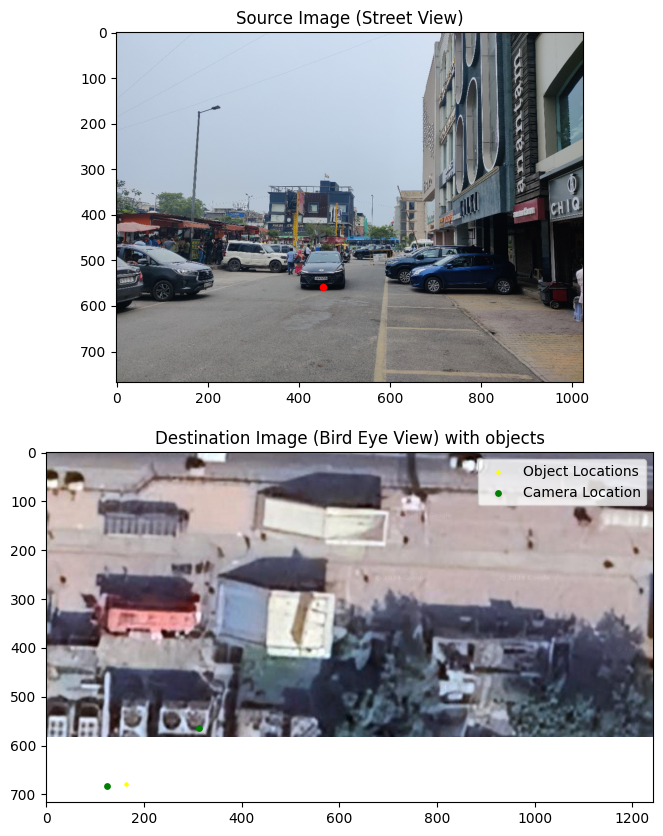

In [11]:
# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

Camera GPS: [28.5680761  77.22094913]
Object GPS: [28.568093968188336, 77.22083906122153]
Google Maps URL: https://www.google.com/maps?q=28.568093968188336,77.22083906122153


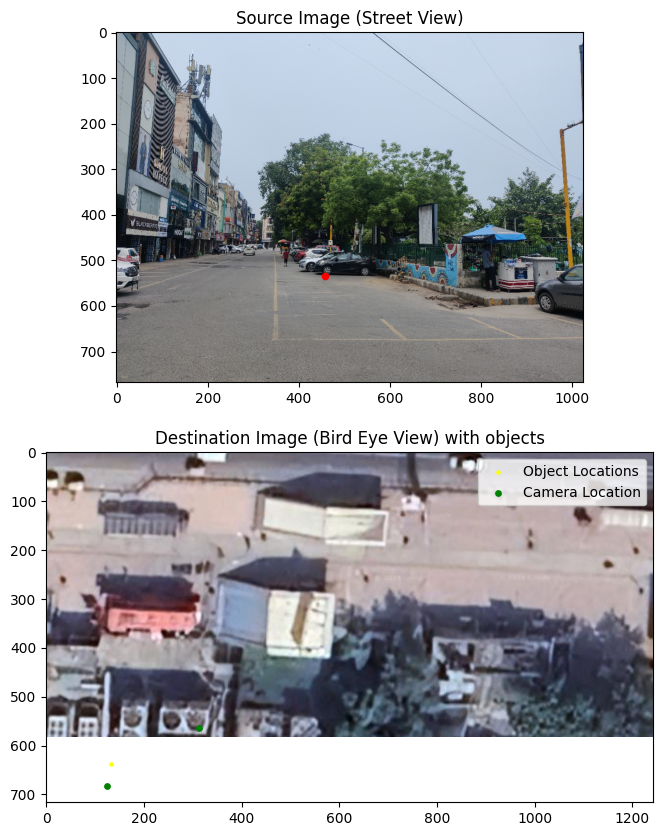

In [12]:
# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('phone4.jpg'), (1024, 768))
im_dst = cv2.imread('gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(224, 539), (373, 473), (887, 512), (730, 468), (3, 542), (245, 766), (780, 764), (542, 432), (602, 430), (445, 427), (376, 427), (461, 421)]).reshape(-1,2)
pts_dst = np.array([(299, 523), (297, 462), (337, 509), (334, 470), (277, 526), (309, 544), (320, 542), (320, 311), (337, 310), (292, 284), (258, 283), (298, 224)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(457, 535)]


# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[313, 565], [125, 682]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
# 28.568076100294167, 77.22094912603553
# 28.568510746076342, 77.2203982072034
camera_gps_1 = np.array([28.568494622999523, 77.22068802602719])
camera_gps = np.array([28.568076100294167, 77.22094912603553])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance

# # Camera pixel locations (x, y) in the image
# camera_location_1 = camera_locations[0]
# camera_location_2 = camera_locations[1]

# # Distance between camera locations (real-world in meters)
# real_world_distance = 28  # As calculated
# pixel_distance_cameras = math.sqrt((camera_location_2[0] - camera_location_1[0])**2 + (camera_location_2[1] - camera_location_1[1])**2)

# # Calculate the scale (meters per pixel)
# scale = real_world_distance / pixel_distance_cameras
angle = math.radians(10)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1
    
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx))  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)


    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

Camera GPS: [28.56853266 77.22125726]
Object GPS: [28.56854371203452, 77.22136972044177]
Google Maps URL: https://www.google.com/maps?q=28.56854371203452,77.22136972044177
Camera GPS: [28.56853266 77.22125726]
Object GPS: [28.568568995084995, 77.22145813031774]
Google Maps URL: https://www.google.com/maps?q=28.568568995084995,77.22145813031774
Camera GPS: [28.56853266 77.22125726]
Object GPS: [28.568561141592717, 77.22149348457398]
Google Maps URL: https://www.google.com/maps?q=28.568561141592717,77.22149348457398


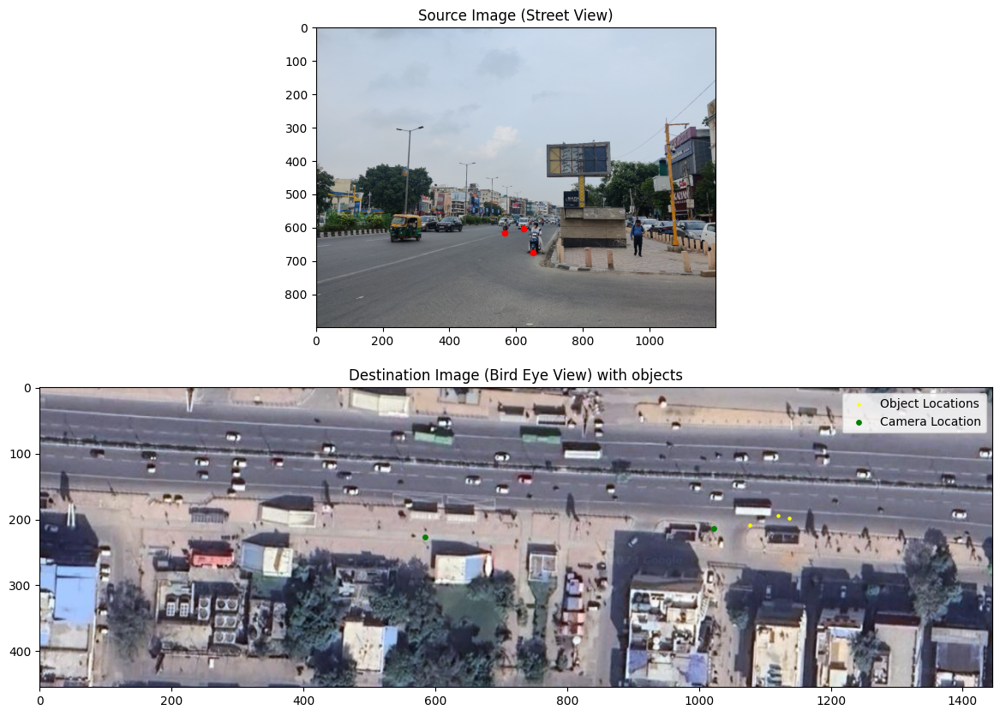

In [13]:
# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures/old_image2.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(117, 679), (257, 653), (492, 612), (622, 588), (1111, 648), (1013, 588), (1002, 565), (1196, 583), (1036, 582), (846, 579), (836, 573), (875, 562), (926, 555), (958, 555), (1053, 650), (863, 646), (990, 588), (906, 588)]).reshape(-1,2)
pts_dst = np.array([(544, 275), (529, 274), (491, 274), (450, 274), (514, 212), (431, 210), (330, 201), (414, 182), (414, 204), (401, 230), (376, 236), (307, 231), (155, 214), (155, 199), (513, 218), (513, 229), (431, 215), (431, 225)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(651, 676), (567, 615), (623, 604)]


# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[585, 226], [1022, 214]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
# 28.568076100294167, 77.22094912603553
# 28.568510746076342, 77.2203982072034
camera_gps_1 = np.array([28.5685130366074, 77.22036075218946])
camera_gps = np.array([28.568532661789664, 77.22125726139974])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance

# # Camera pixel locations (x, y) in the image
# camera_location_1 = camera_locations[0]
# camera_location_2 = camera_locations[1]

# # Distance between camera locations (real-world in meters)
# real_world_distance = 28  # As calculated
# pixel_distance_cameras = math.sqrt((camera_location_2[0] - camera_location_1[0])**2 + (camera_location_2[1] - camera_location_1[1])**2)

# # Calculate the scale (meters per pixel)
# scale = real_world_distance / pixel_distance_cameras
angle = math.radians(190)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1
    
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx))+90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)


    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

In [14]:
print(scale)

0.2007072718520338


In [15]:
for distance in objects_gps:
    print(distance)

[28.56854371203452, 77.22136972044177, 'https://www.google.com/maps?q=28.56854371203452,77.22136972044177', 11.071027109321985]
[28.568568995084995, 77.22145813031774, 'https://www.google.com/maps?q=28.568568995084995,77.22145813031774', 20.06145525800809]
[28.568561141592717, 77.22149348457398, 'https://www.google.com/maps?q=28.568561141592717,77.22149348457398', 23.326792294581434]


In [16]:
distance = geodesic([28.56852763, 77.2214198], [28.568591709697372, 77.22117775222063]).meters
print(distance)

24.724083079658765


Camera GPS: [28.56852763 77.2214198 ]
Object GPS: [28.568584244588802, 77.22120615513624]
Google Maps URL: https://www.google.com/maps?q=28.568584244588802,77.22120615513624
Camera GPS: [28.56852763 77.2214198 ]
Object GPS: [28.568588775518087, 77.2213367596155]
Google Maps URL: https://www.google.com/maps?q=28.568588775518087,77.2213367596155


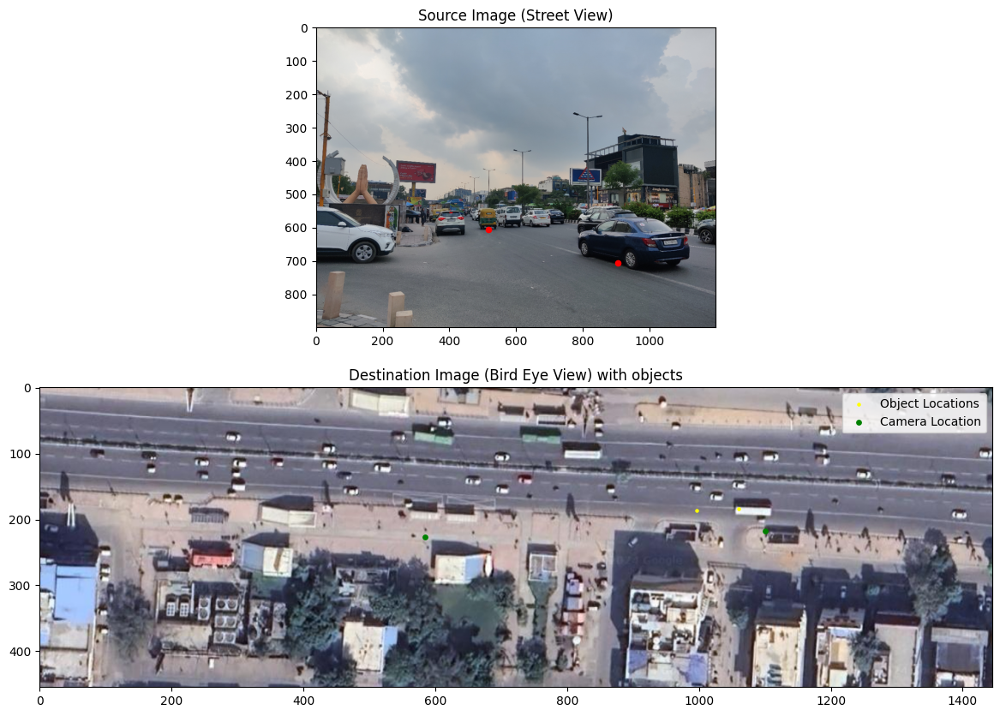

In [17]:
# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures/old_image5.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(117, 679), (257, 653), (492, 612), (622, 588), (1111, 648), (1013, 588), (1002, 565), (1196, 583), (1036, 582), (846, 579), (836, 573), (875, 562), (926, 555), (958, 555), (1053, 650), (863, 646), (990, 588), (906, 588)]).reshape(-1,2)
pts_dst = np.array([(544, 275), (529, 274), (491, 274), (450, 274), (514, 212), (431, 210), (330, 201), (414, 182), (414, 204), (401, 230), (376, 236), (307, 231), (155, 214), (155, 199), (513, 218), (513, 229), (431, 215), (431, 225)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst)
inliers = np.sum(status)

# Object location to transform
object_locations = [(517, 606), (905, 705)]


# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[585, 226], [1101, 218]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
# 28.568076100294167, 77.22094912603553
# 28.568510746076342, 77.2203982072034
camera_gps_1 = np.array([28.5685130366074, 77.22036075218946])
camera_gps = np.array([28.568527629388775, 77.22141979626429])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance

# # Camera pixel locations (x, y) in the image
# camera_location_1 = camera_locations[0]
# camera_location_2 = camera_locations[1]

# # Distance between camera locations (real-world in meters)
# real_world_distance = 28  # As calculated
# pixel_distance_cameras = math.sqrt((camera_location_2[0] - camera_location_1[0])**2 + (camera_location_2[1] - camera_location_1[1])**2)

# # Calculate the scale (meters per pixel)
# scale = real_world_distance / pixel_distance_cameras
angle = math.radians(42)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1
    
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx))+90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)


    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

In [18]:
pts_src = np.array([(800, 280), (664, 283), (243, 282), (73, 305), (1042, 320), (731, 339), (686, 344), (512, 343), (487, 268), (298, 281)]).reshape(-1,2)
pts_dst = np.array([(412, 181), (411, 205), (449, 265), (495, 267), (502, 180), (514, 212), (514, 218), (514, 228), (373, 235), (446, 263)]).reshape(-1,2)

Camera GPS: [28.5685364  77.22157995]
Object GPS: [28.56857009809697, 77.22169535515098]
Real World Distance: 11.893462914295803
Bearing: 71.69650653514559
Google Maps URL: https://www.google.com/maps?q=28.56857009809697,77.22169535515098
Camera GPS: [28.5685364  77.22157995]
Object GPS: [28.568587957873827, 77.22172347209016]
Real World Distance: 15.160919255804012
Bearing: 67.85668029320254
Google Maps URL: https://www.google.com/maps?q=28.568587957873827,77.22172347209016
Camera GPS: [28.5685364  77.22157995]
Object GPS: [28.56858775194922, 77.22168651283542]
Real World Distance: 11.878938397500155
Bearing: 61.37061938676426
Google Maps URL: https://www.google.com/maps?q=28.56858775194922,77.22168651283542


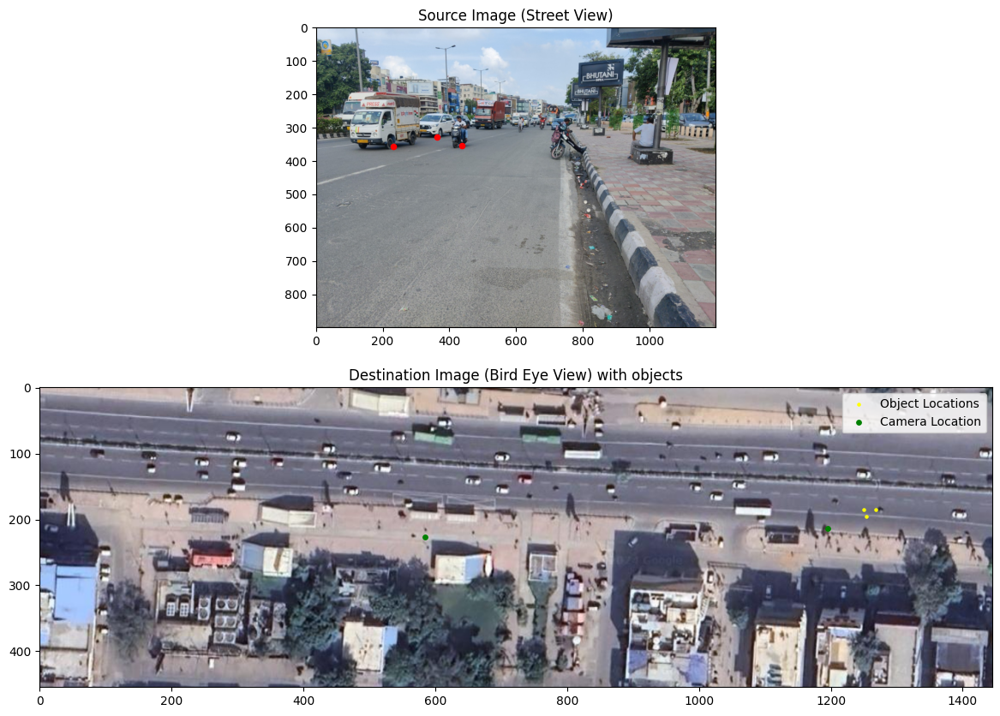

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures/corrected_image3.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(800, 280), (664, 283), (243, 282), (73, 305), (1042, 320), (731, 339), (686, 344), (512, 343), (487, 268), (298, 281)]).reshape(-1, 2)
pts_dst = np.array([(412, 181), (411, 205), (449, 265), (495, 267), (502, 180), (514, 212), (514, 218), (514, 228), (373, 235), (446, 263)]).reshape(-1, 2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst)
inliers = np.sum(status)

# Object location to transform
object_locations = [(439, 354), (362, 327), (232, 357)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[585, 226], [1196, 214]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.5685130366074, 77.22036075218946])
camera_gps = np.array([28.568536396164614, 77.22157994589293])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(168)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")
    print(f"Bearing: {bearing}")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()


In [20]:
# im_src = cv2.resize(cv2.imread('pictures1/image10.jpg'), (1200, 900))
im_src = cv2.imread('pictures/gmap.png')

Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568540410474455, 77.21972800162166]
Real World Distance: 10.616125968360102
Bearing: 258.9989948589481
Google Maps URL: https://www.google.com/maps?q=28.568540410474455,77.21972800162166
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.56853284254888, 77.21979055595823]
Real World Distance: 5.167364584403771
Bearing: 236.333329380754
Google Maps URL: https://www.google.com/maps?q=28.56853284254888,77.21979055595823


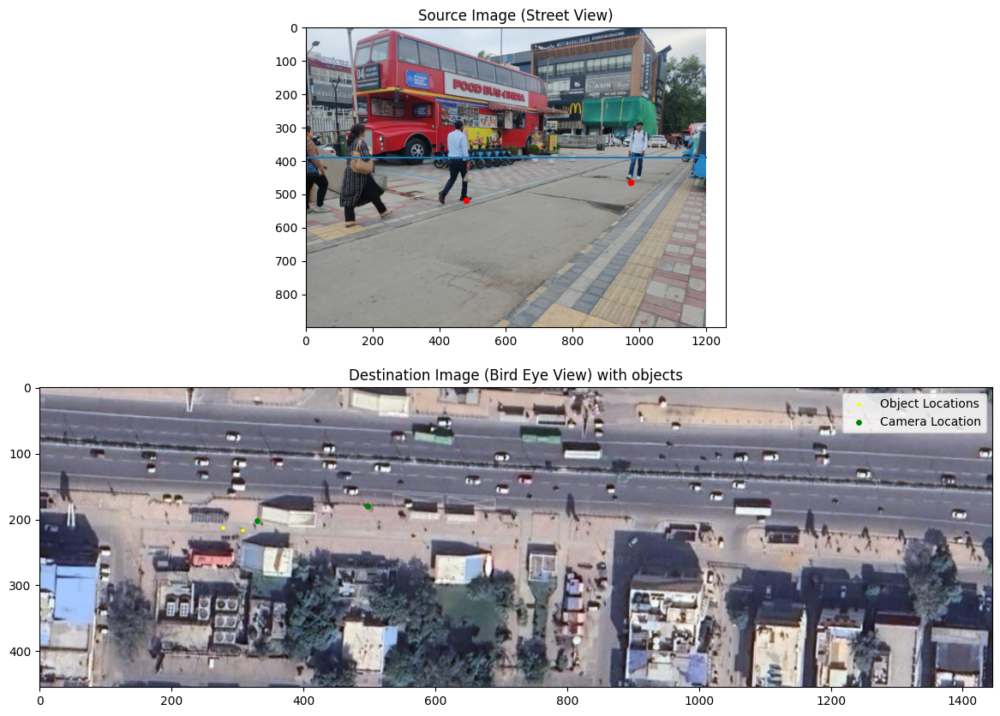

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image10.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(69, 363), (1004, 361), (51, 514), (194, 362), (562, 362), (1103, 444), (168, 440)]).reshape(-1,2)
pts_dst = np.array([(542, 271), (451, 268), (514, 212), (494, 269), (529, 271), (452, 225), (514, 227)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(975, 463), (482, 517)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[497, 180], [329, 202]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.568596339361292, 77.220179350225])
camera_gps = np.array([28.56855868949553, 77.21983451183132])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(36)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")
    print(f"Bearing: {bearing}")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [390, 390]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()


In [22]:
distance = geodesic([28.56855425, 77.21963164], [28.568517460476297, 77.21960292261505]).meters
print(distance)

4.9516913018940585


Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.568516619178354, 77.21959242972369]
Real World Distance: 5.6669027673604395
Bearing: 222.60470674169423
Google Maps URL: https://www.google.com/maps?q=28.568516619178354,77.21959242972369
Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.568440452330254, 77.2195900490866]
Real World Distance: 13.252681814240834
Bearing: 197.88073712425933
Google Maps URL: https://www.google.com/maps?q=28.568440452330254,77.2195900490866
Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.568500438624692, 77.21964583019329]
Real World Distance: 6.123859921996279
Bearing: 166.8939354154221
Google Maps URL: https://www.google.com/maps?q=28.568500438624692,77.21964583019329


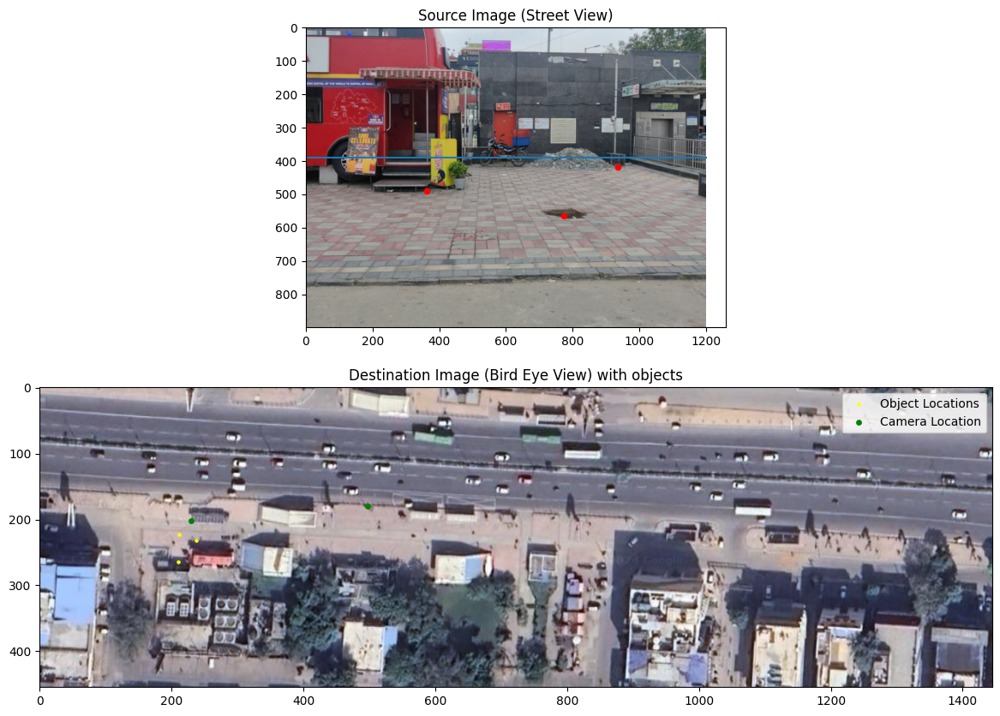

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image19_5.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(69, 363), (1004, 361), (51, 514), (194, 362), (562, 362), (1103, 444), (168, 440)]).reshape(-1,2)
pts_dst = np.array([(542, 271), (451, 268), (514, 212), (494, 269), (529, 271), (452, 225), (514, 227)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(775, 564), (936, 418), (363, 491)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[497, 180], [230, 202]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.568596339361292, 77.220179350225])
camera_gps = np.array([28.5685542545281, 77.21963163762851])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(-15)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")
    print(f"Bearing: {bearing}")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [390, 390]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()


Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.5684972933339, 77.21964774648121]
Real World Distance: 6.506706976398132
Bearing: 165.98195306885992
Google Maps URL: https://www.google.com/maps?q=28.5684972933339,77.21964774648121
Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.56851353064051, 77.21959206019491]
Real World Distance: 5.946861384422626
Bearing: 220.62822706974416
Google Maps URL: https://www.google.com/maps?q=28.56851353064051,77.21959206019491
Camera GPS: [28.56855425 77.21963164]
Object GPS: [28.568432971515342, 77.21959109533343]
Real World Distance: 14.014714558104682
Bearing: 196.4415938425361
Google Maps URL: https://www.google.com/maps?q=28.568432971515342,77.21959109533343


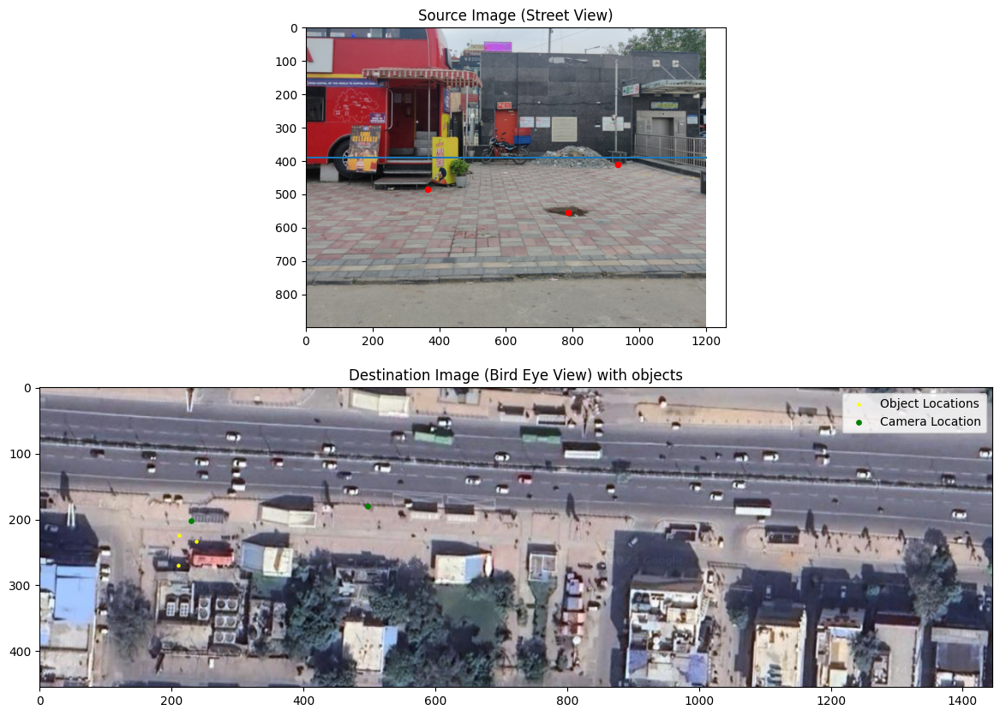

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image19_10.jpg'), (1200, 900))
im_dst = cv2.imread('pictures/gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(69, 363), (1004, 361), (51, 514), (194, 362), (562, 362), (1103, 444), (168, 440)]).reshape(-1,2)
pts_dst = np.array([(542, 271), (451, 268), (514, 212), (494, 269), (529, 271), (452, 225), (514, 227)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(364, 484), (788, 555), (937, 409)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[497, 180], [230, 202]])
object_locations_new = np.copy(transformed_object_locations)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.568596339361292, 77.220179350225])
camera_gps = np.array([28.5685542545281, 77.21963163762851])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(-15)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")
    print(f"Bearing: {bearing}")

    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [390, 390]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()


In [25]:
distance = geodesic([28.56855869, 77.21983451], [28.568542274011723, 77.21972613556514]).meters
print(distance)

10.758391519337437


Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568541670396108, 77.2198054244608]
Real World Distance: 3.414247955116685
Google Maps URL: https://www.google.com/maps?q=28.568541670396108,77.2198054244608
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568540004982214, 77.2198015378405]
Real World Distance: 3.833601599852072
Google Maps URL: https://www.google.com/maps?q=28.568540004982214,77.2198015378405
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.56853764475467, 77.21979603286027]
Real World Distance: 4.428737897724782
Google Maps URL: https://www.google.com/maps?q=28.56853764475467,77.21979603286027
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568534356567408, 77.21978826316011]
Real World Distance: 5.267668849205901
Google Maps URL: https://www.google.com/maps?q=28.568534356567408,77.21978826316011
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.56852887787149, 77.21977576513422]
Real World Distance: 6.629763836612388
Google Maps URL: https://w

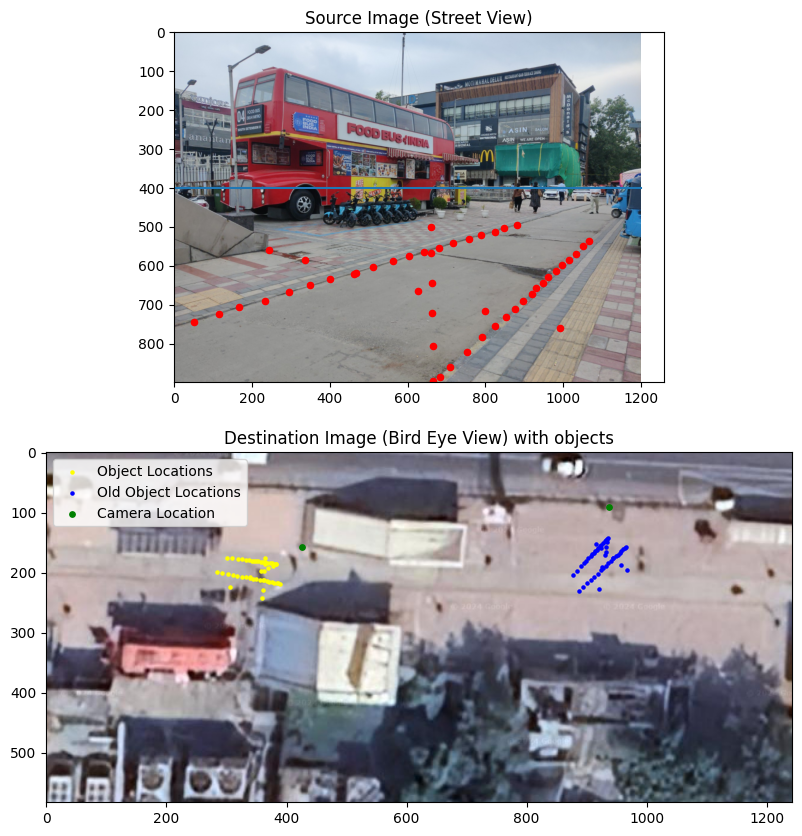

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image17.jpg'), (1200, 900))
im_dst = cv2.imread('gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(53, 417), (180, 416), (367, 416), (542, 416), (713, 417), (998, 418), (1064, 426), (21, 558), (517, 659)]).reshape(-1,2)
pts_dst = np.array([(1075, 367), (1035, 364), (980, 363), (932, 362), (886, 360), (793, 358), (786, 337), (988, 191), (942, 172)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst)
inliers = np.sum(status)

# Object location to transform
object_locations = [(665, 896), (664, 807), (663, 721), (663, 643), (660, 568), (660, 499),
                    (244, 560), (336, 584), (467, 619), (627, 666), (798, 716), (992, 759), (51, 744), (115, 725), (167, 705), (233, 690), (294, 667), (350, 650), (401, 635), 
                    (461, 621), (510, 602), (563, 588), (604, 575), (642, 564), (681, 555), (717, 542), (758, 531), (789, 521), (824, 512), (848, 502), (880, 494), (683, 886), 
                    (710, 860), (753, 822), (791, 784), (824, 756), (852, 732), (876, 712), (896, 691), (920, 672), (931, 658), (947, 644), (960, 628), (982, 613), (997, 599), 
                    (1014, 584), (1033, 569), (1052, 550), (1066, 536)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[937, 91], [426, 157]])
object_locations_new = np.copy(transformed_object_locations)
object_locations_new1 = np.copy(object_locations_new)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.568596339361292, 77.220179350225])
camera_gps = np.array([28.56855868949553, 77.21983451183132])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(54)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")


    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [400, 400]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(object_locations_new1[:, 0, 0], object_locations_new1[:, 0, 1], c='blue', s=5, marker='o', label='Old Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

Camera GPS: [28.56855726 77.21963217]
Object GPS: [28.568497272049576, 77.21963924482701]
Real World Distance: 6.684523383431765
Google Maps URL: https://www.google.com/maps?q=28.568497272049576,77.21963924482701
Camera GPS: [28.56855726 77.21963217]
Object GPS: [28.568483688361333, 77.21959236419424]
Real World Distance: 9.036463188218377
Google Maps URL: https://www.google.com/maps?q=28.568483688361333,77.21959236419424
Camera GPS: [28.56855726 77.21963217]
Object GPS: [28.56848027392723, 77.21961990219198]
Real World Distance: 8.616502558122521
Google Maps URL: https://www.google.com/maps?q=28.56848027392723,77.21961990219198
Camera GPS: [28.56855726 77.21963217]
Object GPS: [28.568524185183588, 77.21964545491298]
Real World Distance: 3.88943207125514
Google Maps URL: https://www.google.com/maps?q=28.568524185183588,77.21964545491298
Camera GPS: [28.56855726 77.21963217]
Object GPS: [28.568524675307025, 77.21964261667289]
Real World Distance: 3.7533516583869138
Google Maps URL: http

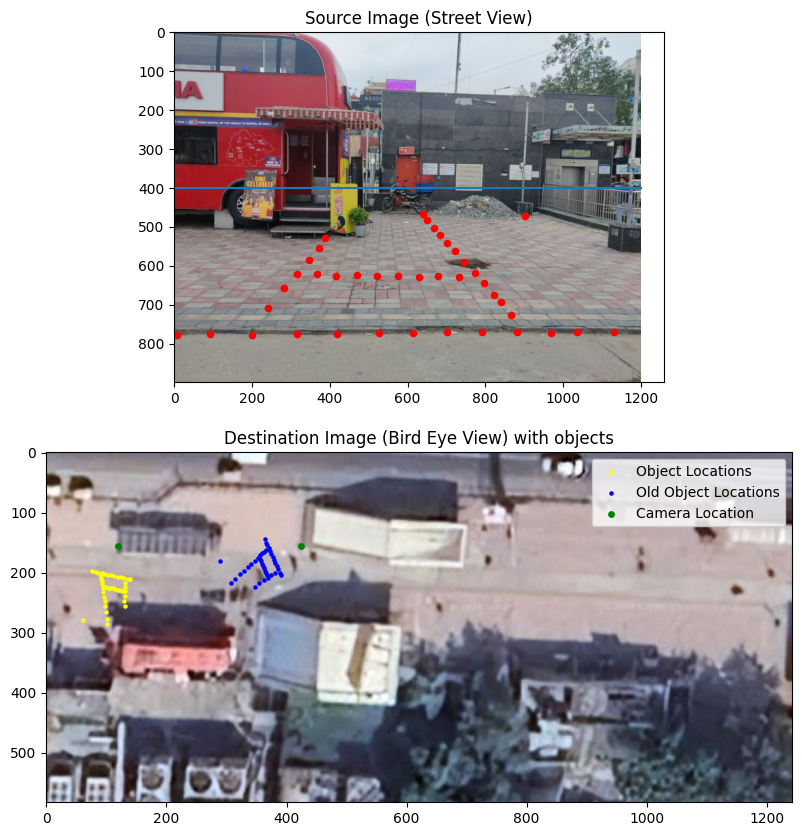

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image19.jpg'), (1200, 900))
im_dst = cv2.imread('gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(324, 399), (238, 468), (668, 363), (878, 351), (621, 482), (958, 532)]).reshape(-1,2)
pts_dst = np.array([(292, 298), (354, 250), (166, 297), (34, 260), (317, 214), (317, 165)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(387, 529), (901, 473), (640, 468), (6, 777), (92, 776), (200, 778), (315, 776), (419, 775), (526, 774), (614, 773), (700, 771), (790, 770), (881, 769), (969, 772), (1035, 771), (1130, 771), (373, 553), (346, 586), (316, 620), (283, 657), (241, 709), (649, 481), (667, 502), (684, 520), (702, 542), (721, 563), (744, 591), (773, 618), (796, 645), (822, 674), (841, 693), (866, 727), (366, 621), (415, 625), (470, 623), (522, 625), (575, 627), (629, 628), (679, 626), (733, 628)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[424, 155], [120, 155]])
object_locations_new = np.copy(transformed_object_locations)
object_locations_new1 = np.copy(object_locations_new)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.56855961755276, 77.21983601891036])
camera_gps = np.array([28.56855726191399, 77.21963217107522])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(-54)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")


    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [400, 400]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
plt.scatter(object_locations_new1[:, 0, 0], object_locations_new1[:, 0, 1], c='blue', s=5, marker='o', label='Old Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()

In [33]:
im_out = cv2.warpPerspective(im_src, h, (im_dst.shape[1],im_dst.shape[0]), flags=cv2.INTER_LINEAR)
cv2.imwrite("test.png", im_out)

True

In [28]:
pts_src = np.array([(136, 101), (523, 113), (1009, 104), (506, 358), (13, 252)]).reshape(-1,2)
pts_dst = np.array([(1031, 373), (932, 344), (806, 367), (940, 178), (971, 191)]).reshape(-1,2)

Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568530714556594, 77.2197984598371]
Real World Distance: 4.696261633006429
Google Maps URL: https://www.google.com/maps?q=28.568530714556594,77.2197984598371
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568535102033824, 77.21978795906769]
Real World Distance: 5.25163745295836
Google Maps URL: https://www.google.com/maps?q=28.568535102033824,77.21978795906769
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.568532081225218, 77.21979214111737]
Real World Distance: 5.0874576791663735
Google Maps URL: https://www.google.com/maps?q=28.568532081225218,77.21979214111737
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.56853175876764, 77.21980685068756]
Real World Distance: 4.029013708128111
Google Maps URL: https://www.google.com/maps?q=28.56853175876764,77.21980685068756
Camera GPS: [28.56855869 77.21983451]
Object GPS: [28.56853231105875, 77.21980597743108]
Real World Distance: 4.0424103374461735
Google Maps URL: https:

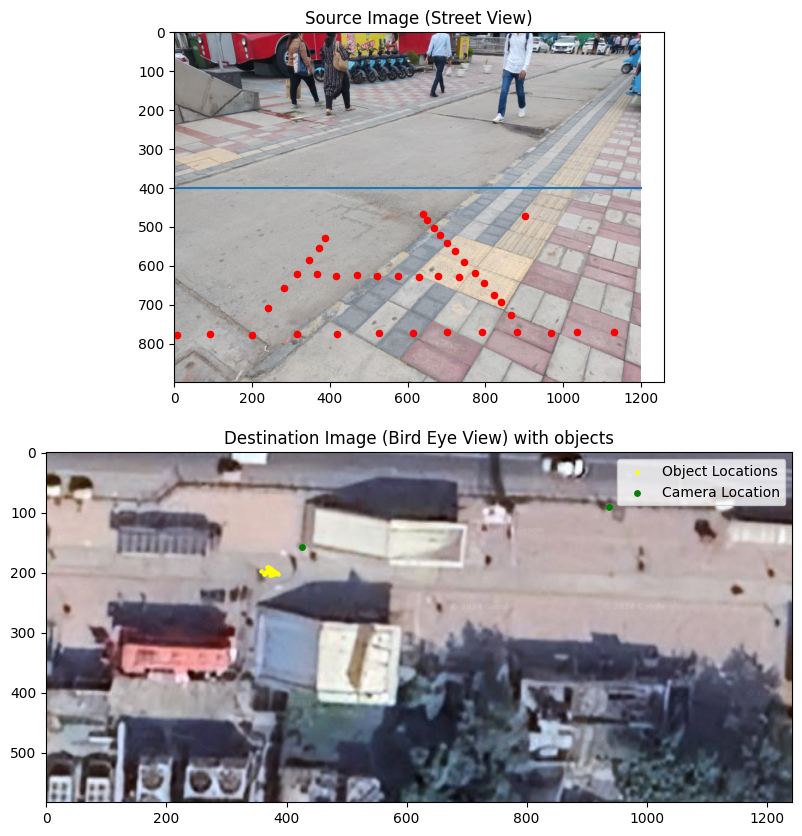

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from geopy.distance import geodesic
from geopy.point import Point

# Load the source (street view) and destination (bird's-eye view) images
im_src = cv2.resize(cv2.imread('pictures1/image11.jpg'), (1200, 900))
im_dst = cv2.imread('gmap.png')

# Manually defined corresponding points in both images
pts_src = np.array([(136, 101), (523, 113), (1009, 104), (506, 358), (13, 252)]).reshape(-1,2)
pts_dst = np.array([(1031, 373), (932, 344), (806, 367), (940, 178), (971, 191)]).reshape(-1,2)

# Compute the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC)
inliers = np.sum(status)

# Object location to transform
object_locations = [(387, 529), (901, 473), (640, 468), (6, 777), (92, 776), (200, 778), (315, 776), (419, 775), (526, 774), (614, 773), (700, 771), (790, 770), (881, 769), (969, 772), (1035, 771), (1130, 771), (373, 553), (346, 586), (316, 620), (283, 657), (241, 709), (649, 481), (667, 502), (684, 520), (702, 542), (721, 563), (744, 591), (773, 618), (796, 645), (822, 674), (841, 693), (866, 727), (366, 621), (415, 625), (470, 623), (522, 625), (575, 627), (629, 628), (679, 626), (733, 628)]

# Convert object locations to float32 and reshape
object_locations_array = np.array(object_locations, dtype=np.float32).reshape(-1, 1, 2)

# Transform the object location points using the homography matrix
transformed_object_locations = cv2.perspectiveTransform(object_locations_array, h)
camera_locations = np.array([[937, 91], [426, 157]])
object_locations_new = np.copy(transformed_object_locations)
object_locations_new1 = np.copy(object_locations_new)

# Camera GPS coordinates (latitude, longitude)
camera_gps_1 = np.array([28.568596339361292, 77.220179350225])
camera_gps = np.array([28.56855868949553, 77.21983451183132])

# Calculate the real-world distance between the two cameras
real_world_distance = geodesic(camera_gps_1, camera_gps).meters

# Calculate the translation vector in pixel coordinates
delta_x = camera_locations[1][0] - camera_locations[0][0]
delta_y = camera_locations[1][1] - camera_locations[0][1]
pixel_distance = math.sqrt(delta_x**2 + delta_y**2)

# Calculate the scale (meters per pixel)
scale = real_world_distance / pixel_distance
angle = math.radians(54)

for object_location in object_locations_new:
    x = object_location[0][0]
    y = object_location[0][1]

    x += camera_locations[1][0] - camera_locations[0][0]
    y += camera_locations[1][1] - camera_locations[0][1]

    translated_x = x - camera_locations[1][0]
    translated_y = y - camera_locations[1][1]

    rotated_x = translated_x * math.cos(angle) - translated_y * math.sin(angle)
    rotated_y = translated_x * math.sin(angle) + translated_y * math.cos(angle)

    x1 = rotated_x + camera_locations[1][0]
    y1 = rotated_y + camera_locations[1][1]

    object_location[0][0] = x1
    object_location[0][1] = y1

# Calculate object GPS coordinates and bearings
objects_gps = []
for object_location in object_locations_new:
    dx = object_location[0][0] - camera_locations[1][0]
    dy = object_location[0][1] - camera_locations[1][1]
    pixel_distance = math.sqrt(dx**2 + dy**2)

    # Convert pixel distance to real-world distance (in meters)
    real_world_distance_object = pixel_distance * scale

    # Calculate bearing (angle) from camera to object in degrees
    bearing = math.degrees(math.atan2(dy, dx)) + 90  # Bearing in degrees

    # Calculate object's GPS coordinates
    object_gps = geodesic(meters=real_world_distance_object).destination(Point(camera_gps[0], camera_gps[1]), bearing)

    print(f"Camera GPS: {camera_gps}")
    print(f"Object GPS: [{object_gps.latitude}, {object_gps.longitude}]")
    print(f"Real World Distance: {real_world_distance_object}")


    google_maps_url = f"https://www.google.com/maps?q={object_gps.latitude},{object_gps.longitude}"
    objects_gps.append([object_gps.latitude, object_gps.longitude, google_maps_url, real_world_distance_object])
    print(f"Google Maps URL: {google_maps_url}")

# Display the result
plt.figure(figsize=(35, 10))

# Show the source image with corresponding points
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(im_src, cv2.COLOR_BGR2RGB))
x1, y1 = [0, 1200], [400, 400]
plt.plot(x1, y1)
plt.scatter(object_locations_array[:, 0, 0], object_locations_array[:, 0, 1], c='red', s=20, marker='o', label='Object Locations')
plt.title('Source Image (Street View)')

# Show the combined image with superimposed street view
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB))
plt.scatter(object_locations_new[:, 0, 0], object_locations_new[:, 0, 1], c='yellow', s=5, marker='o', label='Object Locations')
# plt.scatter(object_locations_new1[:, 0, 0], object_locations_new1[:, 0, 1], c='blue', s=5, marker='o', label='Old Object Locations')
plt.scatter(camera_locations[:, 0], camera_locations[:, 1], c='green', s=15, marker='o', label='Camera Location')
plt.title('Destination Image (Bird Eye View) with objects')
plt.legend()

plt.show()